# 環境確認

In [1]:
import sys
import torch

print("Pythonのバージョン：",sys.version)
print("PyTorchのバージョン：", torch.__version__)
print("使用しているGPUの確認")
!nvidia-smi

Pythonのバージョン： 3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]
PyTorchのバージョン： 1.11.0+cu113
使用しているGPUの確認
NVIDIA-SMI has failed because it couldn't communicate with the NVIDIA driver. Make sure that the latest NVIDIA driver is installed and running.



# データのダウンロード

In [2]:
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  
# Then move kaggle.json into the folder where the API expects to find it.
!mkdir -p ~/.kaggle/ && mv kaggle.json ~/.kaggle/ && chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 68 bytes


In [3]:
!pip install kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [4]:
!kaggle competitions download -c paddy-disease-classification

 99% 1.01G/1.02G [00:36<00:00, 22.5MB/s]
100% 1.02G/1.02G [00:36<00:00, 29.7MB/s]


In [ ]:
!unzip /content/paddy-disease-classification.zip

In [6]:
# ディレクトリ内のデータの確認
%ls

paddy-disease-classification.zip  sample_submission.csv  train.csv
sample_data/                      test_images/           train_images/


# 画像データの確認

In [8]:
# ライブラリのインポート
import os
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import scipy.stats as stats

from PIL import Image
import cv2

## bacterial_leaf_blight

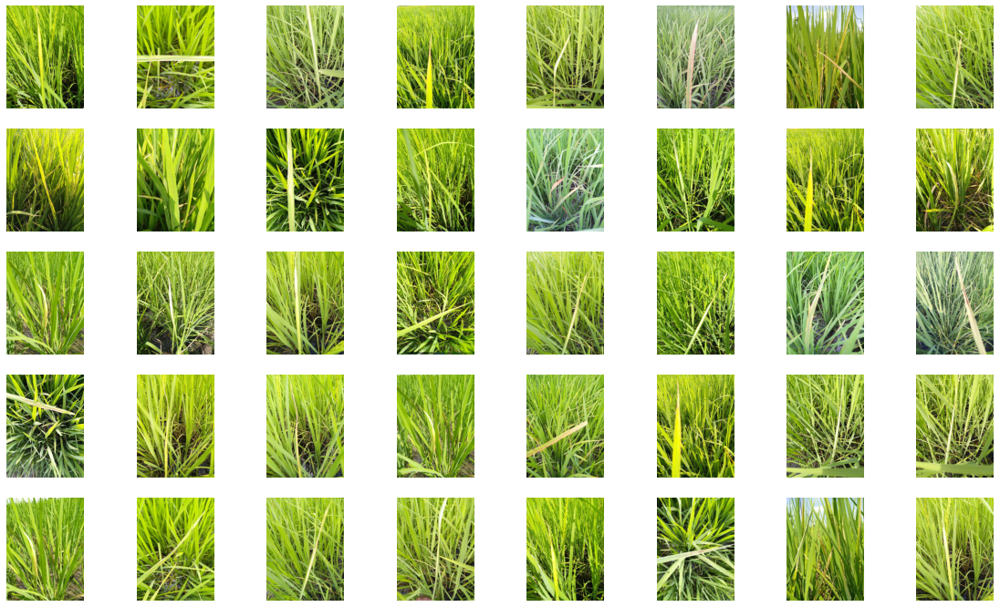

In [11]:
# bacterial_leaf_blight画像の表示
bacterial_leaf_blight_path = '/content/train_images/bacterial_leaf_blight'
bacterial_leaf_blight_list = glob.glob(bacterial_leaf_blight_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = bacterial_leaf_blight_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# bacterial_leaf_streak

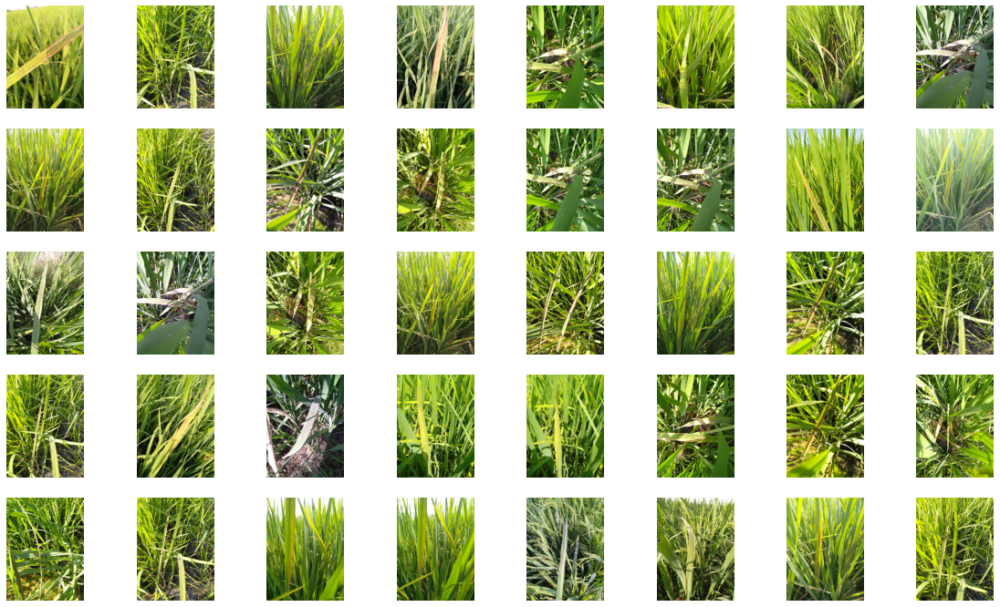

In [12]:
# bacterial_leaf_streak画像の表示
bacterial_leaf_streak_path = '/content/train_images/bacterial_leaf_streak'
bacterial_leaf_streak_list = glob.glob(bacterial_leaf_streak_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = bacterial_leaf_streak_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# bacterial_panicle_blight

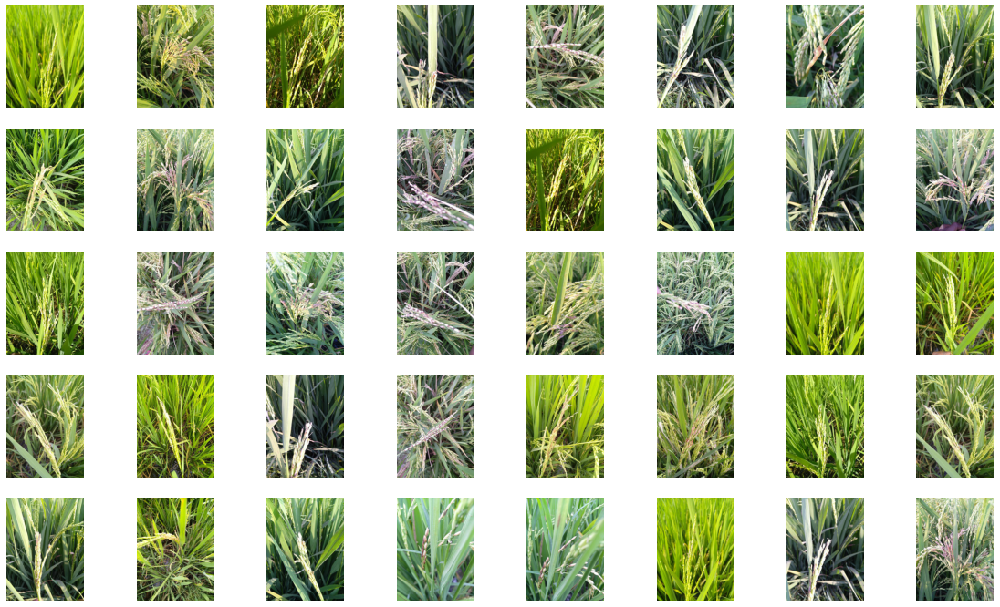

In [13]:
# bacterial_panicle_blight画像の表示
bacterial_panicle_blight_path = '/content/train_images/bacterial_panicle_blight'
bacterial_panicle_blight_list = glob.glob(bacterial_panicle_blight_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = bacterial_panicle_blight_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# blast

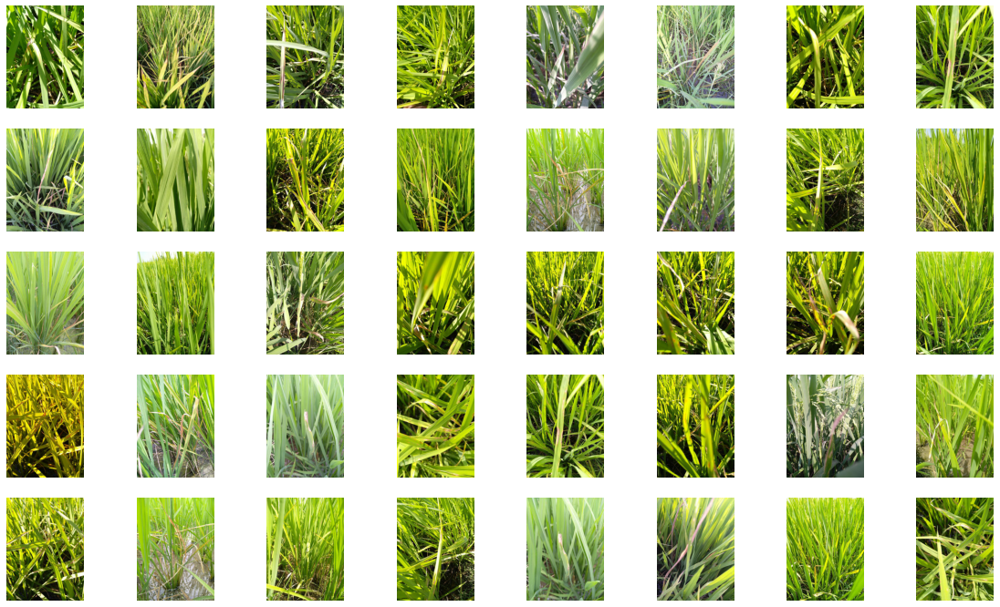

In [14]:
# blast画像の表示
blast_path = '/content/train_images/blast'
blast_list = glob.glob(blast_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = blast_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# brown_spot

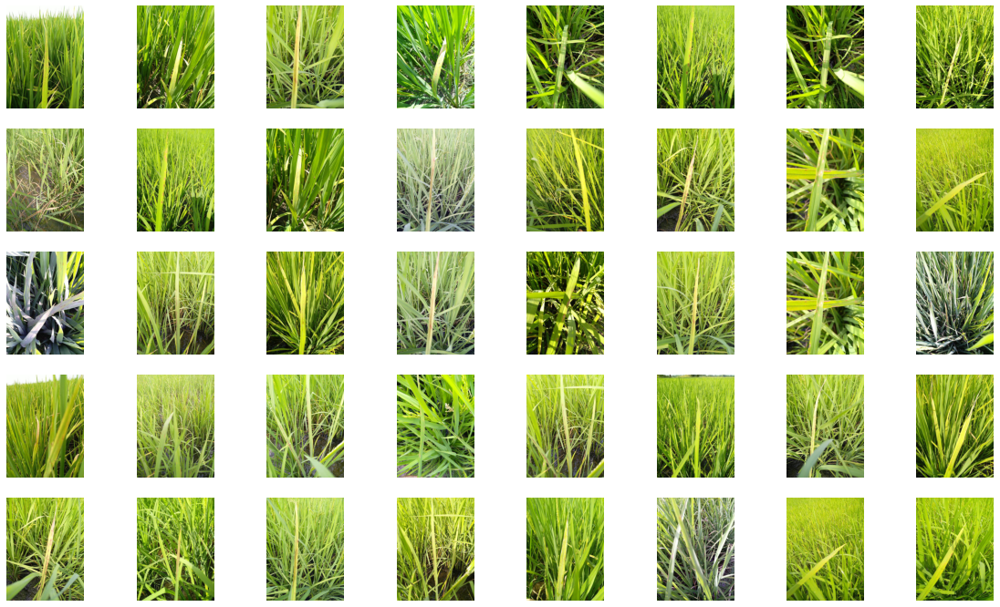

In [15]:
# brown_spot画像の表示
brown_spot_path = '/content/train_images/brown_spot'
brown_spot_list = glob.glob(brown_spot_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = brown_spot_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# dead_heart

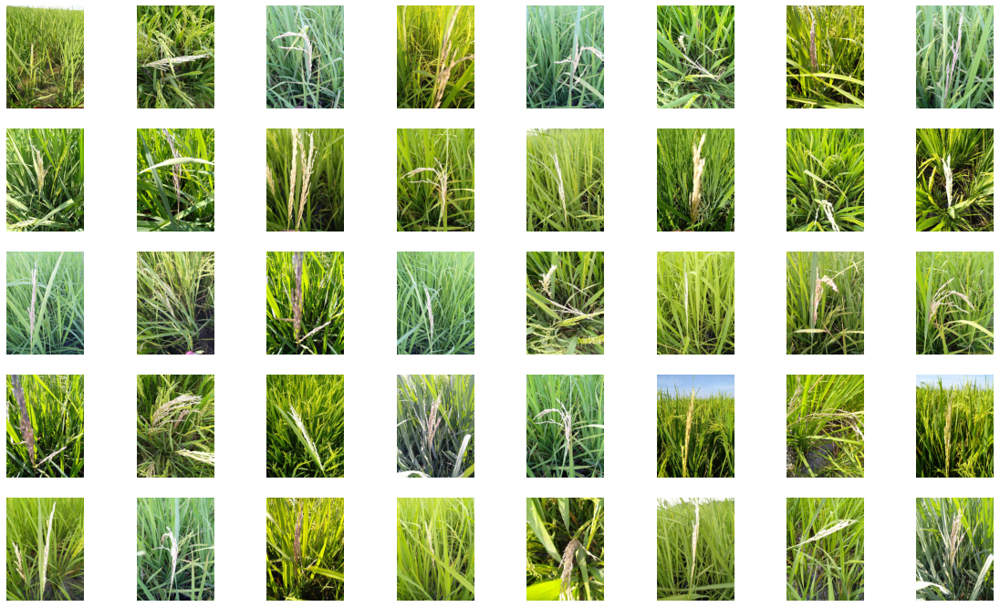

In [16]:
# dead_heart画像の表示
dead_heart_path = '/content/train_images/dead_heart'
dead_heart_list = glob.glob(dead_heart_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = dead_heart_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# downy_mildew

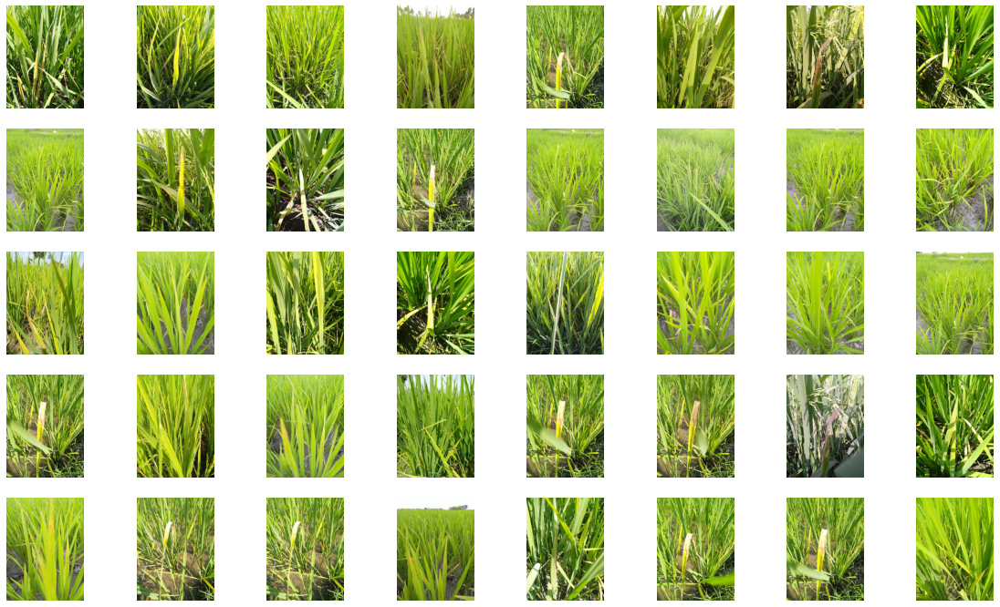

In [17]:
# downy_mildew画像の表示
downy_mildew_path = '/content/train_images/downy_mildew'
downy_mildew_list = glob.glob(downy_mildew_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = downy_mildew_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# hispa

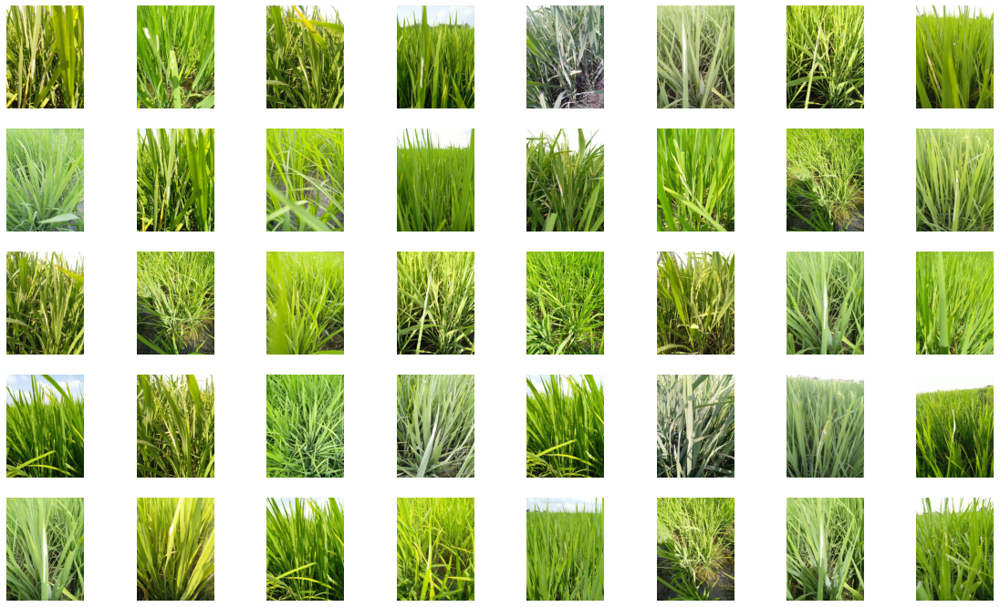

In [18]:
# hispa画像の表示
hispa_path = '/content/train_images/hispa'
hispa_list = glob.glob(hispa_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = hispa_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# normal

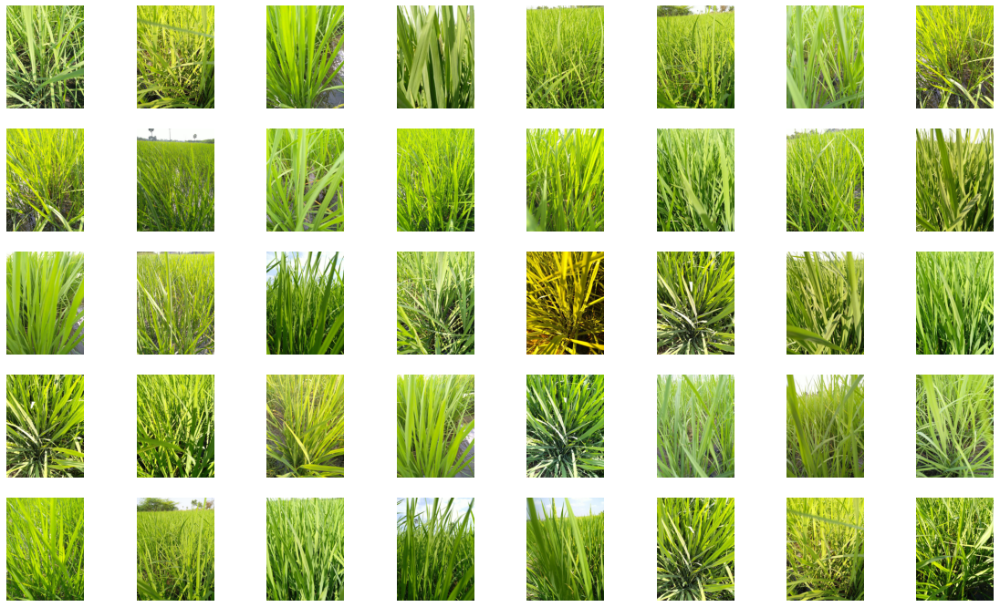

In [19]:
# normal画像の表示
normal_path = '/content/train_images/normal'
normal_list = glob.glob(normal_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = normal_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)

# tungro

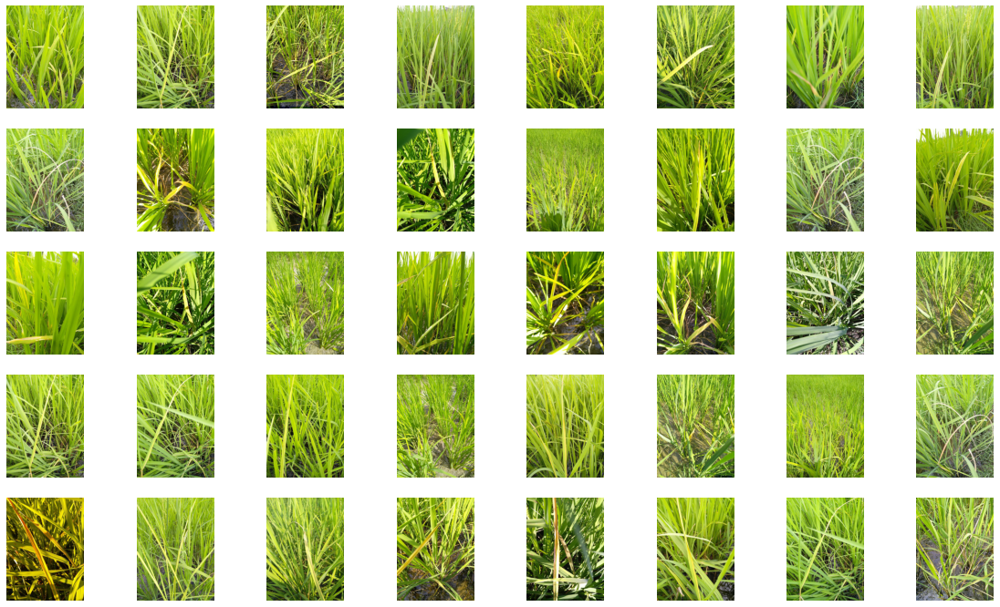

In [20]:
# tungro画像の表示
tungro_path = '/content/train_images/tungro'
tungro_list = glob.glob(tungro_path+'/*.jpg')

plt.figure(figsize=(20, 12))
for i in range(40):
    path = tungro_list[i]
    plt.subplot(5, 8, i+1)
    plt.axis('off')
    img = Image.open(path)
    img_array = np.array(img)
    plt.imshow(img_array)